In [2]:
import pandas as pd
pd.set_option('display.max_columns', 50)

In [6]:
org_data_df1 = pd.read_csv("./data/2000 to 2005 ACCIDENT/ACCIDENT.csv")
org_data_df2 = pd.read_csv("./data/ACCIDENT/ACCIDENT.csv")
org_data_df = pd.concat([org_data_df1, org_data_df2])

C:\Users\HanHsin\AppData\Local\Temp\ipykernel_6668\3677117859.py:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  org_data_df1 = pd.read_csv("./data/2000 to 2005 ACCIDENT/ACCIDENT.csv")
C:\Users\HanHsin\AppData\Local\Temp\ipykernel_6668\3677117859.py:2: DtypeWarning: Columns (10,13) have mixed types. Specify dtype option on import or set low_memory=False.
  org_data_df2 = pd.read_csv("./data/ACCIDENT/ACCIDENT.csv")


In [7]:
org_data_df.columns = org_data_df.columns.str.lower()

In [8]:
time_format = "%d/%m/%Y_%H:%M:%S"
org_data_df["accident_datetime"] = pd.to_datetime((org_data_df["accidentdate"]+"_"+org_data_df["accidenttime"]).str.replace(".", ":").str.strip(), format = time_format)
org_data_df = org_data_df.set_index(pd.DatetimeIndex(org_data_df["accident_datetime"]))
org_data_df = org_data_df.drop(columns=["accident_datetime"])

In [23]:
# with pd.option_context('display.min_rows',20, 'display.max_rows',40,'display.max_columns', None):  
# with pd.option_context('display.max_columns', None):  
display(org_data_df)

,accident_no,accidentdate,accidenttime,accident_type,accident type desc,day_of_week,day week description,dca_code,dca description,directory,edition,page,grid_reference_x,grid_reference_y,light_condition,light condition desc,node_id,no_of_vehicles,no_persons,no_persons_inj_2,no_persons_inj_3,no_persons_killed,no_persons_not_inj,police_attend,road_geometry,road geometry desc,severity,speed_zone
accident_datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-01-04 22:30:00,12000000389,4/01/2000,22.30.00,4,Collision with a fixed object,3,Tuesday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,40.0,88,H,11.0,5,Dark No street lights,25264,1,2,1,0,1,0,1,5,Not at intersection,1,90
2000-01-06 22:15:00,12000000554,6/01/2000,22.15.00,4,Collision with a fixed object,5,Thursday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,40.0,87,C,1.0,3,Dark Street lights on,42800,1,1,1,0,0,0,1,2,T intersection,2,60
2000-01-01 18:00:00,12000000555,1/01/2000,18.00.00,1,Collision with vehicle,7,Saturday,130,REAR END(VEHICLES IN SAME LANE),MEL,40.0,2P,C,6.0,1,Day,40101,4,4,1,1,0,2,1,2,T intersection,2,60
2000-01-02 01:00:00,12000000559,2/01/2000,01.00.00,4,Collision with a fixed object,1,Sunday,181,OFF RIGHT BEND INTO OBJECT/PARKED VEHICLE ...,MEL,40.0,76,F,7.0,3,Dark Street lights on,127638,1,2,2,0,0,0,1,5,Not at intersection,2,60
2000-01-03 23:50:00,12000000586,3/01/2000,23.50.00,1,Collision with vehicle,2,Monday,110,CROSS TRAFFIC(INTERSECTIONS ONLY),MEL,40.0,69,A,3.0,3,Dark Street lights on,57539,3,3,0,2,0,1,1,1,Cross intersection,3,70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-11-01 12:11:00,T20200019239,1/11/2020,12:11:00,1,Collision with vehicle,0,Sunday,142,LEAVING PARKING,MEL,46,44,B,12,1,Day,665835,2,4,1,0,0,3,1,5,Not at intersection,2,50
2020-11-01 15:30:00,T20200019247,1/11/2020,15:30:00,4,Collision with a fixed object,1,Sunday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,46,468,A,9,1,Day,665912,1,2,2,0,0,0,1,5,Not at intersection,2,999
2020-11-01 18:00:00,T20200019250,1/11/2020,18:00:00,1,Collision with vehicle,0,Sunday,116,LEFT NEAR (INTERSECTIONS ONLY),MEL,40,10,D,1,1,Day,226603,2,2,1,0,0,1,1,1,Cross intersection,2,60


In [24]:
org_data_df.describe()

,accident_type,day_of_week,dca_code,light_condition,node_id,no_of_vehicles,no_persons,no_persons_inj_2,no_persons_inj_3,no_persons_killed,no_persons_not_inj,police_attend,road_geometry,severity,speed_zone
count,306769.000000,306769.000000,306769.000000,306769.000000,306769.000000,306769.000000,306769.000000,306769.000000,306769.000000,306769.000000,306769.000000,306769.000000,306769.000000,306769.000000,306769.000000
mean,2.239288,4.028513,139.110901,1.822903,158468.058360,1.794960,2.477591,0.394088,0.902767,0.020540,1.160019,1.272316,3.321056,2.635478,108.093471
std,1.969605,1.990725,26.449977,1.478014,137099.443479,0.746506,1.595841,0.638906,0.827800,0.157891,1.398710,0.555848,1.778516,0.519729,187.319534
min,1.000000,0.000000,100.000000,1.000000,-10.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,30.000000
25%,1.000000,2.000000,120.000000,1.000000,42110.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,2.000000,60.000000
50%,1.000000,4.000000,130.000000,1.000000,137621.000000,2.000000,2.000000,0.000000,1.000000,0.000000,1.000000,1.000000,5.000000,3.000000,60.000000
75%,4.000000,6.000000,171.000000,3.000000,247644.000000,2.000000,3.000000,1.000000,1.000000,0.000000,2.000000,2.000000,5.000000,3.000000,80.000000
max,9.000000,7.000000,199.000000,9.000000,666096.000000,21.000000,97.000000,19.000000,43.000000,11.000000,87.000000,9.000000,9.000000,4.000000,999.000000


In [25]:
from ydata_profiling import ProfileReport

profile = ProfileReport(org_data_df, title="Profiling Report")

In [26]:
profile

Render HTML: 100%|███████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.72s/it]


In [73]:
# with pd.option_context('display.min_rows',80, 'display.max_rows',80):  
#     display(org_data_df[org_data_df.duplicated(subset=[org_data_df.columns[i] for i in [1,2,16]], keep=False)].sort_index())

,accident_no,accidentdate,accidenttime,accident_type,accident type desc,day_of_week,day week description,dca_code,dca description,directory,edition,page,grid_reference_x,grid_reference_y,light_condition,light condition desc,node_id,no_of_vehicles,no_persons,no_persons_inj_2,no_persons_inj_3,no_persons_killed,no_persons_not_inj,police_attend,road_geometry,road geometry desc,severity,speed_zone
accident_datetime,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2000-03-11 13:50:00,22000025706,11/03/2000,13.50.00,6,Vehicle overturned (no collision),7,Saturday,180,OFF CARRIAGEWAY ON RIGHT BEND,VCS,9.0,551,R,8.0,1,Day,57298,1,1,0,1,0,0,1,1,Cross intersection,3,60
2000-03-11 13:50:00,22000018101,11/03/2000,13.50.00,4,Collision with a fixed object,7,Saturday,183,OFF LEFT BEND INTO OBJECT/PARKED VEHICLE ...,VCS,9.0,551,R,8.0,1,Day,57298,1,1,0,1,0,0,1,1,Cross intersection,3,60
2000-03-31 07:15:00,12000014321,31/03/2000,07.15.00,2,Struck Pedestrian,6,Friday,102,FAR SIDE. PED HIT BY VEHICLE FROM THE LEFT ...,MEL,40.0,2L,A,6.0,1,Day,37592,1,2,0,1,0,1,2,1,Cross intersection,3,60
2000-03-31 07:15:00,12000022434,31/03/2000,07.15.00,2,Struck Pedestrian,6,Friday,100,PED NEAR SIDE. PED HIT BY VEHICLE FROM THE RIG...,MEL,40.0,2L,A,6.0,1,Day,37592,1,2,0,1,0,1,2,1,Cross intersection,3,60
2000-04-30 22:36:00,42000015259,30/04/2000,22.36.00,4,Collision with a fixed object,1,Sunday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,40.0,60,J,10.0,3,Dark Street lights on,40625,1,1,0,1,0,0,1,1,Cross intersection,3,60
2000-04-30 22:36:00,42000015804,30/04/2000,22.36.00,4,Collision with a fixed object,1,Sunday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,40.0,60,J,10.0,3,Dark Street lights on,40625,1,1,0,1,0,0,1,1,Cross intersection,3,60
2000-05-23 06:20:00,42000026289,23/05/2000,06.20.00,1,Collision with vehicle,3,Tuesday,113,RIGHT NEAR (INTERSECTIONS ONLY),MEL,40.0,48,H,9.0,3,Dark Street lights on,39528,2,2,1,0,0,1,1,2,T intersection,2,80
2000-05-23 06:20:00,42000023999,23/05/2000,06.20.00,1,Collision with vehicle,3,Tuesday,113,RIGHT NEAR (INTERSECTIONS ONLY),MEL,40.0,48,H,9.0,3,Dark Street lights on,39528,2,2,1,0,0,1,1,2,T intersection,2,80
2000-07-29 13:00:00,12001000661,29/07/2000,13.00.00,1,Collision with vehicle,7,Saturday,130,REAR END(VEHICLES IN SAME LANE),MEL,40.0,79,B,6.0,1,Day,42391,4,6,0,2,0,4,1,2,T intersection,3,60


In [87]:
[org_data_df.columns[i] for i in [1,2,16]]

['accidentdate', 'accidenttime', 'node_id']

In [9]:
accident_df = org_data_df.drop_duplicates(subset=[org_data_df.columns[i] for i in [1,2,16]], keep="last")

In [78]:
max_time_df1 = max(pd.to_datetime((org_data_df1["ACCIDENTDATE"]+"_"+org_data_df1["ACCIDENTTIME"]).str.replace(".", ":").str.strip(), format = time_format))
max_time_df1

Timestamp('2005-12-31 23:25:00')

In [81]:
min_time_df1 = min(pd.to_datetime((org_data_df2["ACCIDENTDATE"]+"_"+org_data_df2["ACCIDENTTIME"]).str.replace(".", ":").str.strip(), format = time_format))
min_time_df1

Timestamp('2006-01-01 00:01:00')

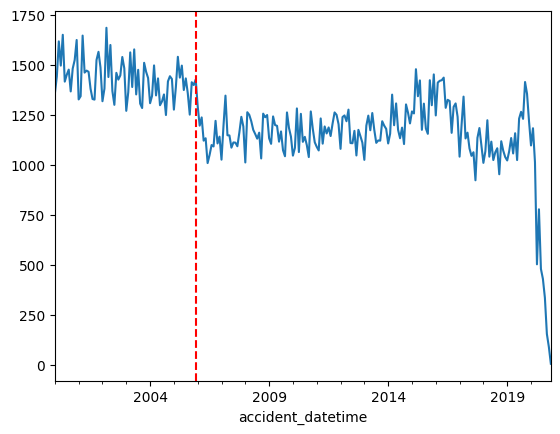

In [86]:
accident_df["accident_no"].groupby(pd.Grouper(freq='M')).count().plot()
plt.axvline(max_time_df1, color='r', linestyle='--')

<Axes: xlabel='accident_datetime'>

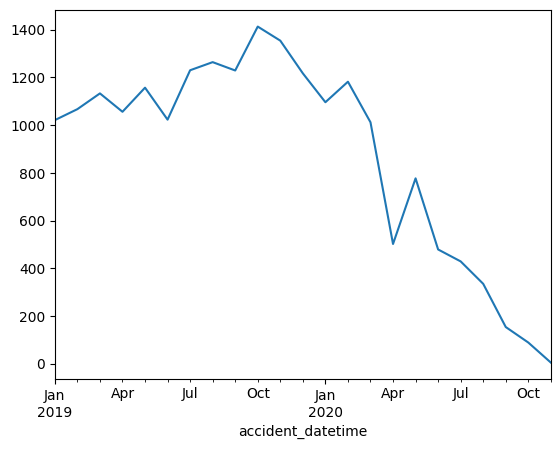

In [95]:
#COVID!
org_data_df[(org_data_df.index>"2019")&(org_data_df.index<"2021")]["accident_no"].groupby(pd.Grouper(freq='M')).count().plot()

In [ ]:
#Data is not ordered by date

In [51]:
org_data_df1

,accident_no,accidentdate,accidenttime,accident_type,accident type desc,day_of_week,day week description,dca_code,dca description,directory,...,no_persons_inj_2,no_persons_inj_3,no_persons_killed,no_persons_not_inj,police_attend,road_geometry,road geometry desc,severity,speed_zone,accident_datetime
0,12000000389,4/01/2000,22.30.00,4,Collision with a fixed object,3,Tuesday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,...,1,0,1,0,1,5,Not at intersection,1,90,2000-01-04 22:30:00
1,12000000554,6/01/2000,22.15.00,4,Collision with a fixed object,5,Thursday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,...,1,0,0,0,1,2,T intersection,2,60,2000-01-06 22:15:00
2,12000000555,1/01/2000,18.00.00,1,Collision with vehicle,7,Saturday,130,REAR END(VEHICLES IN SAME LANE),MEL,...,1,1,0,2,1,2,T intersection,2,60,2000-01-01 18:00:00
3,12000000559,2/01/2000,01.00.00,4,Collision with a fixed object,1,Sunday,181,OFF RIGHT BEND INTO OBJECT/PARKED VEHICLE ...,MEL,...,2,0,0,0,1,5,Not at intersection,2,60,2000-01-02 01:00:00
4,12000000586,3/01/2000,23.50.00,1,Collision with vehicle,2,Monday,110,CROSS TRAFFIC(INTERSECTIONS ONLY),MEL,...,0,2,0,1,1,1,Cross intersection,3,70,2000-01-03 23:50:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103056,T20090005214,2/09/2005,10.30.00,2,Struck Pedestrian,6,Friday,107,PED ON FOOTHPATH STRUCK BY VEHENTERING/LEAVING...,MEL,...,0,1,0,1,2,5,Not at intersection,3,50,2005-09-02 10:30:00
103057,T20090049786,31/01/2003,14.30.00,1,Collision with vehicle,6,Friday,130,REAR END(VEHICLES IN SAME LANE),MEL,...,0,1,0,1,2,1,Cross intersection,3,70,2003-01-31 14:30:00
103058,T20100008170,26/04/2003,11.50.00,1,Collision with vehicle,7,Saturday,140,U TURN,MEL,...,0,1,0,1,9,5,Not at intersection,3,60,2003-04-26 11:50:00
103059,T20100028295,28/07/2004,09.00.00,1,Collision with vehicle,4,Wednesday,139,OTHER SAME DIRECTION-MANOUEVRES NOT INCLUDED I...,MEL,...,0,1,0,1,2,4,Multiple intersection,3,50,2004-07-28 09:00:00


In [3]:
from pathlib import Path
path_list = ["./data/2000 to 2005 ACCIDENT","./data/ACCIDENT"]
def load_file(file_name):
    df_list = [pd.read_csv(Path(folder_path) / file_name) for folder_path in path_list]
    data_df = pd.concat(df_list).reset_index(drop=True)
    data_df.columns = data_df.columns.str.lower()
    return data_df

In [4]:
# Join location info
# Joining with accident_no causes tons of NAs
node_df = load_file("NODE.csv")
node_df = node_df.drop_duplicates(subset=["node_id"])
node_df

C:\Users\HanHsin\AppData\Local\Temp\ipykernel_6668\1796970014.py:4: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df_list = [pd.read_csv(Path(folder_path) / file_name) for folder_path in path_list]


,accident_no,node_id,node_type,amg_x,amg_y,lga_name,region name,deg urban name,lat,long,postcode no,vicgrid94_x,vicgrid94_y,lga_name_all,region_name,deg_urban_name,postcode_no
0,12000000389,25264,N,2512514.427,2388780.839,DANDENONG,METROPOLITAN SOUTH EAST REGION,Metropolitan Excluding CBD,-38.002110,145.142480,3173.0,NaN,NaN,NaN,NaN,NaN,NaN
1,12000000554,42800,I,2506548.994,2392856.260,KINGSTON,METROPOLITAN SOUTH EAST REGION,Metropolitan Excluding CBD,-37.965450,145.074530,3192.0,NaN,NaN,NaN,NaN,NaN,NaN
2,12000000555,40101,I,2498299.136,2404214.048,PORT PHILLIP,METROPOLITAN NORTH WEST REGION,Metropolitan Excluding CBD,-37.863140,144.980670,3182.0,NaN,NaN,NaN,NaN,NaN,NaN
3,12000000559,127638,N,2500115.047,2395234.944,BAYSIDE,METROPOLITAN SOUTH EAST REGION,Metropolitan Excluding CBD,-37.944040,145.001310,3188.0,NaN,NaN,NaN,NaN,NaN,NaN
4,12000000586,57539,I,2505935.803,2401836.040,STONNINGTON,METROPOLITAN SOUTH EAST REGION,Metropolitan Excluding CBD,-37.884550,145.067480,3145.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
326407,T20090046284,229107,N,NaN,NaN,WHITTLESEA,NaN,NaN,-37.676468,145.050491,NaN,2504453.781,2424931.347,WHITTLESEA,METROPOLITAN NORTH WEST REGION,MELB_URBAN,3082.0
326408,T20090046106,229103,N,NaN,NaN,WHITTLESEA,NaN,NaN,-37.645401,144.991064,NaN,2499211.462,2428380.388,WHITTLESEA,METROPOLITAN NORTH WEST REGION,MELB_URBAN,3076.0
326410,T20090047746,229114,N,NaN,NaN,BOROONDARA,NaN,NaN,-37.791877,145.093559,NaN,2508240.178,2412119.954,BOROONDARA,METROPOLITAN SOUTH EAST REGION,MELB_URBAN,3104.0
326411,T20090044445,229087,N,NaN,NaN,INDIGO,NaN,NaN,-36.092861,146.702041,NaN,2653269.886,2599283.209,INDIGO,NORTH EASTERN REGION,RURAL_VICTORIA,3688.0


In [5]:
accident_df

NameError: name 'accident_df' is not defined

In [99]:
data_df = accident_df.merge(node_df[["node_id","lat","long"]],how="left", left_on="node_id", right_on="node_id")
data_df

,accident_no,accidentdate,accidenttime,accident_type,accident type desc,day_of_week,day week description,dca_code,dca description,directory,edition,page,grid_reference_x,grid_reference_y,light_condition,light condition desc,node_id,no_of_vehicles,no_persons,no_persons_inj_2,no_persons_inj_3,no_persons_killed,no_persons_not_inj,police_attend,road_geometry,road geometry desc,severity,speed_zone,lat,long
0,12000000389,4/01/2000,22.30.00,4,Collision with a fixed object,3,Tuesday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,40.0,88,H,11.0,5,Dark No street lights,25264,1,2,1,0,1,0,1,5,Not at intersection,1,90,-38.002110,145.142480
1,12000000554,6/01/2000,22.15.00,4,Collision with a fixed object,5,Thursday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,40.0,87,C,1.0,3,Dark Street lights on,42800,1,1,1,0,0,0,1,2,T intersection,2,60,-37.965450,145.074530
2,12000000555,1/01/2000,18.00.00,1,Collision with vehicle,7,Saturday,130,REAR END(VEHICLES IN SAME LANE),MEL,40.0,2P,C,6.0,1,Day,40101,4,4,1,1,0,2,1,2,T intersection,2,60,-37.863140,144.980670
3,12000000559,2/01/2000,01.00.00,4,Collision with a fixed object,1,Sunday,181,OFF RIGHT BEND INTO OBJECT/PARKED VEHICLE ...,MEL,40.0,76,F,7.0,3,Dark Street lights on,127638,1,2,2,0,0,0,1,5,Not at intersection,2,60,-37.944040,145.001310
4,12000000586,3/01/2000,23.50.00,1,Collision with vehicle,2,Monday,110,CROSS TRAFFIC(INTERSECTIONS ONLY),MEL,40.0,69,A,3.0,3,Dark Street lights on,57539,3,3,0,2,0,1,1,1,Cross intersection,3,70,-37.884550,145.067480
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
306700,T20200019239,1/11/2020,12:11:00,1,Collision with vehicle,0,Sunday,142,LEAVING PARKING,MEL,46,44,B,12,1,Day,665835,2,4,1,0,0,3,1,5,Not at intersection,2,50,-37.828081,144.983214
306701,T20200019247,1/11/2020,15:30:00,4,Collision with a fixed object,1,Sunday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,46,468,A,9,1,Day,665912,1,2,2,0,0,0,1,5,Not at intersection,2,999,-38.213352,144.443982
306702,T20200019250,1/11/2020,18:00:00,1,Collision with vehicle,0,Sunday,116,LEFT NEAR (INTERSECTIONS ONLY),MEL,40,10,D,1,1,Day,226603,2,2,1,0,0,1,1,1,Cross intersection,2,60,-37.656112,145.079942
306703,T20200019253,1/11/2020,12:00:00,6,Vehicle overturned (no collision),1,Sunday,180,OFF CARRIAGEWAY ON RIGHT BEND,VCD,9,50,J,9,1,Day,665836,1,1,1,0,0,0,1,5,Not at intersection,2,80,-36.965594,147.478154


In [101]:
data_df["coordinate"] = list(zip(data_df.lat, data_df.long))
data_df

,accident_no,accidentdate,accidenttime,accident_type,accident type desc,day_of_week,day week description,dca_code,dca description,directory,edition,page,grid_reference_x,grid_reference_y,light_condition,light condition desc,node_id,no_of_vehicles,no_persons,no_persons_inj_2,no_persons_inj_3,no_persons_killed,no_persons_not_inj,police_attend,road_geometry,road geometry desc,severity,speed_zone,lat,long,coordinate
0,12000000389,4/01/2000,22.30.00,4,Collision with a fixed object,3,Tuesday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,40.0,88,H,11.0,5,Dark No street lights,25264,1,2,1,0,1,0,1,5,Not at intersection,1,90,-38.002110,145.142480,"(-38.00211, 145.14248)"
1,12000000554,6/01/2000,22.15.00,4,Collision with a fixed object,5,Thursday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,40.0,87,C,1.0,3,Dark Street lights on,42800,1,1,1,0,0,0,1,2,T intersection,2,60,-37.965450,145.074530,"(-37.96545, 145.07453)"
2,12000000555,1/01/2000,18.00.00,1,Collision with vehicle,7,Saturday,130,REAR END(VEHICLES IN SAME LANE),MEL,40.0,2P,C,6.0,1,Day,40101,4,4,1,1,0,2,1,2,T intersection,2,60,-37.863140,144.980670,"(-37.86314, 144.98067)"
3,12000000559,2/01/2000,01.00.00,4,Collision with a fixed object,1,Sunday,181,OFF RIGHT BEND INTO OBJECT/PARKED VEHICLE ...,MEL,40.0,76,F,7.0,3,Dark Street lights on,127638,1,2,2,0,0,0,1,5,Not at intersection,2,60,-37.944040,145.001310,"(-37.94404, 145.00131)"
4,12000000586,3/01/2000,23.50.00,1,Collision with vehicle,2,Monday,110,CROSS TRAFFIC(INTERSECTIONS ONLY),MEL,40.0,69,A,3.0,3,Dark Street lights on,57539,3,3,0,2,0,1,1,1,Cross intersection,3,70,-37.884550,145.067480,"(-37.88455, 145.06748)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
306700,T20200019239,1/11/2020,12:11:00,1,Collision with vehicle,0,Sunday,142,LEAVING PARKING,MEL,46,44,B,12,1,Day,665835,2,4,1,0,0,3,1,5,Not at intersection,2,50,-37.828081,144.983214,"(-37.828081, 144.9832138)"
306701,T20200019247,1/11/2020,15:30:00,4,Collision with a fixed object,1,Sunday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,46,468,A,9,1,Day,665912,1,2,2,0,0,0,1,5,Not at intersection,2,999,-38.213352,144.443982,"(-38.21335217, 144.4439823)"
306702,T20200019250,1/11/2020,18:00:00,1,Collision with vehicle,0,Sunday,116,LEFT NEAR (INTERSECTIONS ONLY),MEL,40,10,D,1,1,Day,226603,2,2,1,0,0,1,1,1,Cross intersection,2,60,-37.656112,145.079942,"(-37.65611212, 145.0799417)"
306703,T20200019253,1/11/2020,12:00:00,6,Vehicle overturned (no collision),1,Sunday,180,OFF CARRIAGEWAY ON RIGHT BEND,VCD,9,50,J,9,1,Day,665836,1,1,1,0,0,0,1,5,Not at intersection,2,80,-36.965594,147.478154,"(-36.96559419, 147.4781545)"


In [104]:
hospital_df = pd.read_csv("./data/MainHospitalList.csv")
hospital_df.columns = hospital_df.columns.str.lower()
hospital_df

,hospital id,formal name,other name,emergency capable,location address,suburb,postcode,access point,category,agency type,coordinate
0,3485,Albury Wodonga Health,Albury Wodonga Health,YES,69 Vermont Street,Wodonga,3690,NaN,PUBLIC,Public Hospital,"-36.13197319158869, 146.87986370493027"
1,12990,"Albury Wodonga Health, Albury Campus","Albury Wodonga Health, Albury Campus",YES,Borella,Albury,2640,NaN,PUBLIC,Public Hospital,"-36.07861244230171, 146.9377196986903"
2,3483,Angliss Hospital,Angliss Hospital,YES,Albert Street,Upper Ferntree Gully,3156,NaN,PUBLIC,Public Hospital,"-37.89872650532987, 145.31367643087236"
3,11733,Austin Health - Austin Hospital,Austin Health - Austin Hospital,YES,145 Studley Road,Heidelberg,3084,NaN,PUBLIC,Public Hospital,"-37.75626108952502, 145.05861716827758"
4,6272,Bairnsdale Regional Health Service,Bairnsdale Regional Health Service,YES,122 Day St,Bairnsdale,3875,NaN,PUBLIC,Public Hospital,"-37.83120857196654, 147.60778589711597"
5,10441,Barwon Health,Barwon Health,YES,272-322 Ryrie Street,Geelong,3220,NaN,PUBLIC,Public Hospital,"-38.151234270930864, 144.36562229920983"
6,3292,Bendigo Health,Bendigo Health,YES,62 Lucan St,Bendigo,3550,NaN,PUBLIC,Public Hospital,"-36.74962823726239, 144.28077224034632"
7,3403,Box Hill Hospital,Box Hill Hospital,YES,51 Nelson Road,Box Hill,3128,NaN,PUBLIC,Public Hospital,"-37.81357762374263, 145.11829842595031"
8,12280,Casey Hospital,Casey Hospital,YES,52 Kangan Drive,Berwick,3806,NaN,PUBLIC,Public Hospital,"-38.04500177191388, 145.3475725971249"
9,11269,Central Gippsland Health Service,Central Gippsland Health Service,YES,155 Guthridge Parade,Sale,3850,NaN,PUBLIC,Public Hospital,"-38.10874530371505, 147.08078559449058"


In [105]:
from ast import literal_eval
hospital_df["coordinate"] = hospital_df["coordinate"].apply(literal_eval)

In [106]:
hospital_df

,hospital id,formal name,other name,emergency capable,location address,suburb,postcode,access point,category,agency type,coordinate
0,3485,Albury Wodonga Health,Albury Wodonga Health,YES,69 Vermont Street,Wodonga,3690,NaN,PUBLIC,Public Hospital,"(-36.13197319158869, 146.87986370493027)"
1,12990,"Albury Wodonga Health, Albury Campus","Albury Wodonga Health, Albury Campus",YES,Borella,Albury,2640,NaN,PUBLIC,Public Hospital,"(-36.07861244230171, 146.9377196986903)"
2,3483,Angliss Hospital,Angliss Hospital,YES,Albert Street,Upper Ferntree Gully,3156,NaN,PUBLIC,Public Hospital,"(-37.89872650532987, 145.31367643087236)"
3,11733,Austin Health - Austin Hospital,Austin Health - Austin Hospital,YES,145 Studley Road,Heidelberg,3084,NaN,PUBLIC,Public Hospital,"(-37.75626108952502, 145.05861716827758)"
4,6272,Bairnsdale Regional Health Service,Bairnsdale Regional Health Service,YES,122 Day St,Bairnsdale,3875,NaN,PUBLIC,Public Hospital,"(-37.83120857196654, 147.60778589711597)"
5,10441,Barwon Health,Barwon Health,YES,272-322 Ryrie Street,Geelong,3220,NaN,PUBLIC,Public Hospital,"(-38.151234270930864, 144.36562229920983)"
6,3292,Bendigo Health,Bendigo Health,YES,62 Lucan St,Bendigo,3550,NaN,PUBLIC,Public Hospital,"(-36.74962823726239, 144.28077224034632)"
7,3403,Box Hill Hospital,Box Hill Hospital,YES,51 Nelson Road,Box Hill,3128,NaN,PUBLIC,Public Hospital,"(-37.81357762374263, 145.11829842595031)"
8,12280,Casey Hospital,Casey Hospital,YES,52 Kangan Drive,Berwick,3806,NaN,PUBLIC,Public Hospital,"(-38.04500177191388, 145.3475725971249)"
9,11269,Central Gippsland Health Service,Central Gippsland Health Service,YES,155 Guthridge Parade,Sale,3850,NaN,PUBLIC,Public Hospital,"(-38.10874530371505, 147.08078559449058)"


In [132]:
import geopy.distance as geo_distance
def get_min_hospital_distance(row, hospital_coor_list = list(hospital_df["coordinate"])):
    # print(row.loc["coordinate"])
    # print(row)
    try:
        return min([geo_distance.distance(row["coordinate"],hospital_coor).km for hospital_coor in hospital_coor_list])
    except:
        return -1

In [115]:
get_min_hospital_distance(data_df.iloc[0])

(-38.00211, 145.14248)


7.31527147887042

In [136]:
node_df["coordinate"] = list(zip(node_df.lat, node_df.long))


In [137]:
from tqdm import tqdm
tqdm.pandas(desc='Calculating distance to ER')
node_df["hospital_distance"] = node_df.progress_apply(lambda row: get_min_hospital_distance(row), axis=1)

Calculating distance to ER: 100%|█████████████████████████████████████████████| 192756/192756 [18:42<00:00, 171.76it/s]


,node_id,hospital_distance
69606,2,14.639399
49253,3,10.513244
104754,4,4.628801
45625,5,4.951063
694,6,2.011056
...,...,...
322182,666001,0.576044
320770,666018,24.015182
321086,666033,5.792985
320771,666054,5.662858


In [143]:
node_df[["node_id","hospital_distance"]].sort_values("node_id").to_csv("./data/NodeHospitalDistance.csv",index=False)

NameError: name 'node_df' is not defined

In [ ]:
#df[['C', 'D']] = df.apply(myfunc1, axis=1, result_type='expand')